*Based on the Perceptual Losses for Real-Time Style Transfer and Super Resolution*  
https://arxiv.org/pdf/1603.08155.pdf.  
Trained on a unet Architecture

# Super Resolution

In [30]:
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.utils.mem import *

from torchvision.models import vgg16_bn

In [2]:
path = untar_data(URLs.PETS)
path_hr = path/'images'#small-256
path_lr = path/'crappy'#small-96
path

PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet')

In [3]:
il = ImageList.from_folder(path_hr)

In [4]:
il.items

array([PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/pomeranian_123.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/Bengal_87.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/Ragdoll_52.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/wheaten_terrier_54.jpg'), ...,
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/saint_bernard_171.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/saint_bernard_24.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/Siamese_63.jpg'),
       PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/Maine_Coon_207.jpg')], dtype=object)

Uncomment the first time you run this notebook.

In [5]:
# from crappify import *
# parallel(crappifier(path_lr, path_hr), il.items)

In [6]:
bs, size = 32, 128
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=12)

In [7]:
def get_data(bs, size):
    data = (src.label_from_func(lambda x: path_hr/x.name)
           .transform(get_transforms(max_zoom=2.), size=size, tfm_y=True)
           .databunch(bs=bs).normalize(imagenet_stats, do_y=True))
    data.c = 3 #rgb
    return data

In [8]:
data = get_data(bs, size)

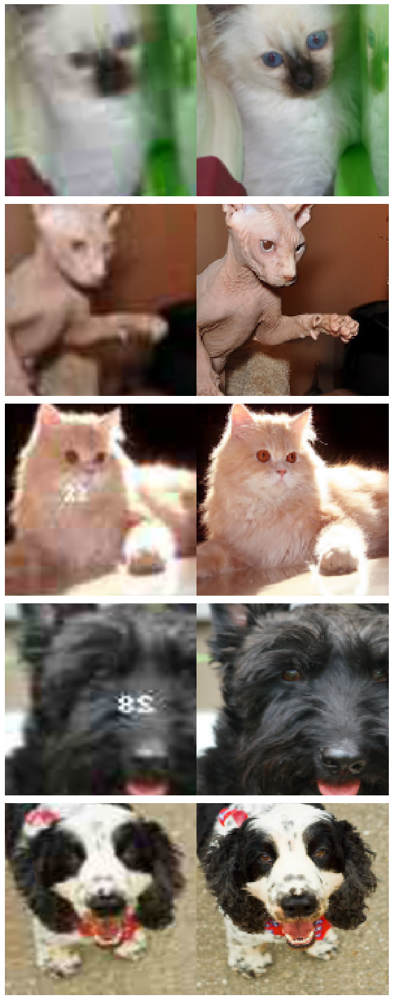

In [9]:
data.show_batch()

# Feature Loss

In [10]:
t = data.valid_ds[0][1].data; t.shape

torch.Size([3, 128, 128])

torch.stack concatenates two rtensors along a new dimension  
So if A and B are of shape (3, 4), torch.cat([A, B], dim=0) will be of shape (6, 4) and torch.stack([A, B], dim=0) will be of shape (2, 3, 4)

In [11]:
t = torch.stack([t,t]); t.shape

torch.Size([2, 3, 128, 128])

In [12]:
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)

In [13]:
n,c,h,w = t.size()
x = t.view(n,c,-1)
x.shape

torch.Size([2, 3, 16384])

In [14]:
x.transpose(1,2).shape

torch.Size([2, 16384, 3])

In [15]:
y = gram_matrix(t)
y.shape

torch.Size([2, 3, 3])

In [16]:
gram_matrix(t)

tensor([[[0.0824, 0.0752, 0.0621],
         [0.0752, 0.0690, 0.0573],
         [0.0621, 0.0573, 0.0484]],

        [[0.0824, 0.0752, 0.0621],
         [0.0752, 0.0690, 0.0573],
         [0.0621, 0.0573, 0.0484]]])

In [17]:
base_loss = F.l1_loss # can be either mse or l1

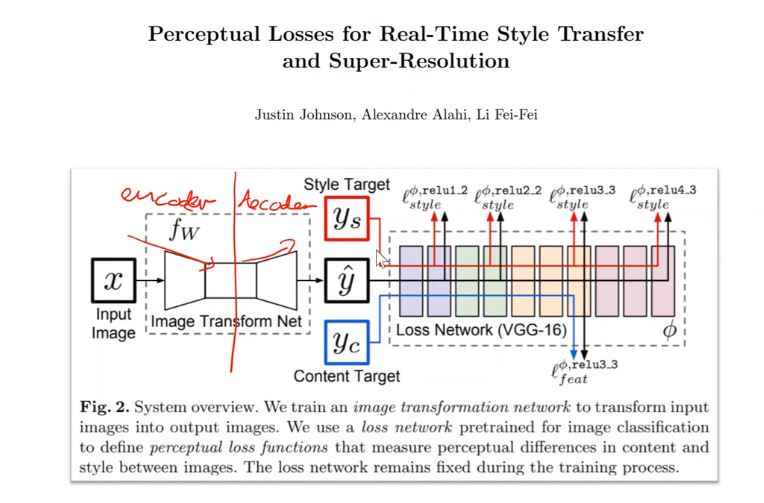

In [18]:
# vgg_bn is the pretrained model. The function .features in vgg contains the convolution part of the model.
# So we select that part of the model as we don't need the head of the model but only the intermediate activations
# We chuck it on the gpu and put into eval mode as we're not training it.
vgg_m = vgg16_bn(True).features.cuda().eval() 
requires_grad(vgg_m, False) #  we dont want to update the weights as we're just using in inference for calculating loss; 
# Hence we set it to False

In [19]:
# The grid size of the tensors changes in the max pooling layers of the vgg model.
# We wanna grab features from everytime just before the grid size changes hence the layer (i-1)
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)] 
blocks, [vgg_m[i] for i in blocks]

([5, 12, 22, 32, 42],
 [ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True),
  ReLU(inplace=True)])

The output above is the list of the layer numbers just before the max pooling layers in the variable blocks.

In [20]:
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat # the pretrained model. model which contains the features on which we want our feature losses
        self.loss_features = [self.m_feat[i] for i in layer_ids] # grabbing all layers from the network that we want features for
        self.hooks = hook_outputs(self.loss_features, detach=False) # grabbing intermediate layers by hooking 'em
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True) # passes target(actual y) to make_features which then calls the vgg model and go through all stored activations and grab a copy of em
        in_feat = self.make_features(input) # same thing for ip(which is the o/p of the generator).
        self.feat_losses = [base_loss(input,target)] # calculating l1 loss between the pixels as we still want it a little bit
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)] # going thorugh all the features and getting the l1 loss on them by grabbing the activations on each of them
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses) # summing them all up
    
    def __del__(self): self.hooks.remove()

In [21]:
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

## Train

In [22]:
# the callback_fns prints out all the losses of different layers
# blur and norm_type in Part2
wd = 1e-3
learn = unet_learner(data, arch, wd=wd, loss_func=feat_loss, callback_fns=LossMetrics,
                     blur=True, norm_type=NormType.Weight)
gc.collect();

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


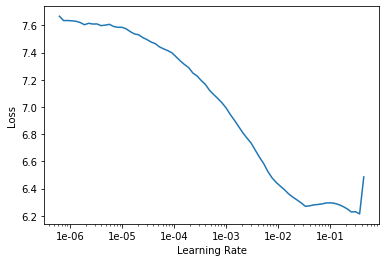

In [27]:
learn.lr_find()
learn.recorder.plot()

In [23]:
lr = 1e-3

In [24]:
def do_fit(save_name, lrs=slice(lr), pct_start=0.9):
    learn.fit_one_cycle(10, lrs, pct_start=pct_start)
    learn.save(save_name)
    learn.show_results(rows=1, imgsize=5)

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,4.203082,4.153586,0.165443,0.257802,0.359480,0.256326,0.611906,1.332412,1.170219,01:10
1,4.078996,4.042981,0.160471,0.254142,0.352584,0.251147,0.580780,1.294550,1.149308,01:05
2,4.036211,4.008788,0.170906,0.254839,0.351068,0.246593,0.574932,1.279968,1.130481,01:05
3,3.998245,3.939339,0.164205,0.254673,0.347636,0.242321,0.555541,1.261153,1.113810,01:05
4,3.948967,3.843498,0.159694,0.249137,0.338424,0.235758,0.541365,1.230105,1.089014,01:05
5,3.926354,3.835532,0.157355,0.250183,0.338365,0.233917,0.546399,1.230446,1.078866,01:05
6,3.866370,3.800435,0.162193,0.250073,0.335872,0.232083,0.523602,1.223367,1.073245,01:05
7,3.828206,3.734112,0.155054,0.248116,0.331839,0.227007,0.521470,1.202556,1.048070,01:05
8,3.800625,3.758116,0.164725,0.247680,0.330705,0.226588,0.533828,1.206843,1.047747,01:05
9,3.696829,3.600480,0.151784,0.244586,0.321684,0.218320,0.489519,1.160116,1.014471,01:05


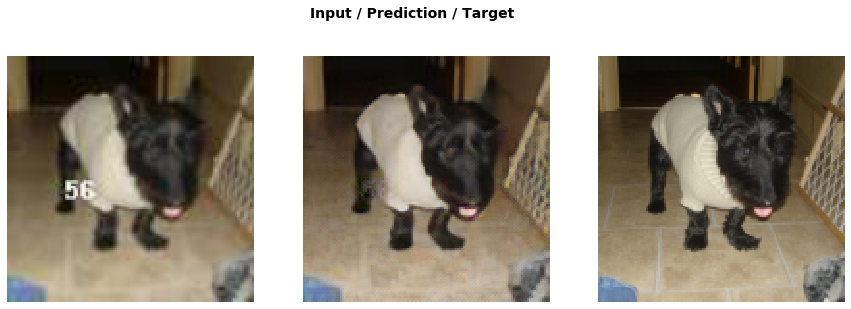

In [30]:
do_fit('1a', slice(lr*10))

In [37]:
#gram loss will be taught in Part2

In [32]:
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,3.679420,3.592098,0.151208,0.244202,0.320879,0.217909,0.487826,1.157274,1.012800,01:08
1,3.667499,3.584426,0.151229,0.244029,0.320355,0.217315,0.486720,1.154855,1.009923,01:08
2,3.670100,3.578167,0.150836,0.243661,0.319888,0.216969,0.485564,1.153177,1.008072,01:08
3,3.662618,3.572121,0.150870,0.243265,0.319003,0.216263,0.486390,1.150960,1.005371,01:08
4,3.650305,3.562224,0.151668,0.243116,0.318349,0.216019,0.480383,1.147653,1.005036,01:08
5,3.642576,3.550225,0.150090,0.242507,0.317585,0.214846,0.480691,1.145056,0.999451,01:08
6,3.620524,3.539701,0.150726,0.242047,0.316948,0.214149,0.478963,1.141056,0.995813,01:08
7,3.616241,3.540996,0.151154,0.242048,0.316559,0.213953,0.479932,1.141395,0.995955,01:08
8,3.618098,3.526094,0.151298,0.242081,0.315795,0.213322,0.474879,1.136664,0.992055,01:08
9,3.586591,3.504448,0.149985,0.240982,0.313996,0.211471,0.473358,1.131036,0.983621,01:08


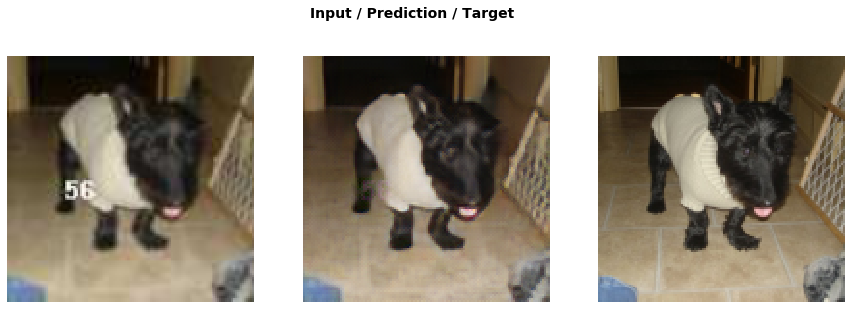

In [33]:
do_fit('1b', slice(1e-5,lr))

In [34]:
data = get_data(12,size*2) # halving the batch size %& doubling img size

In [35]:
learn.data = data
learn.freeze()
gc.collect()

20761

In [36]:
learn.load('1b');

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,2.322428,2.335998,0.178191,0.275821,0.313823,0.164658,0.397417,0.619935,0.386154,04:39
1,2.328327,2.310401,0.178901,0.276467,0.312320,0.163330,0.386007,0.611816,0.381561,04:24
2,2.287566,2.288810,0.179104,0.275218,0.309995,0.162503,0.380011,0.603481,0.378498,04:24
3,2.268830,2.271227,0.180255,0.275080,0.308307,0.161386,0.371950,0.598820,0.375428,04:24
4,2.246542,2.268769,0.181332,0.274179,0.307051,0.160428,0.372471,0.599523,0.373785,04:24
5,2.251995,2.237964,0.179232,0.273321,0.305282,0.159341,0.361260,0.588730,0.370798,04:24
6,2.232085,2.237821,0.181722,0.273980,0.304773,0.158397,0.360276,0.589783,0.368890,04:25
7,2.228022,2.232034,0.181892,0.274181,0.304173,0.158902,0.356134,0.587796,0.368956,04:25
8,2.200878,2.212284,0.178945,0.272639,0.303144,0.157174,0.352109,0.581916,0.366356,04:25
9,2.186525,2.197590,0.179881,0.271855,0.301105,0.155932,0.348199,0.577722,0.362895,04:25


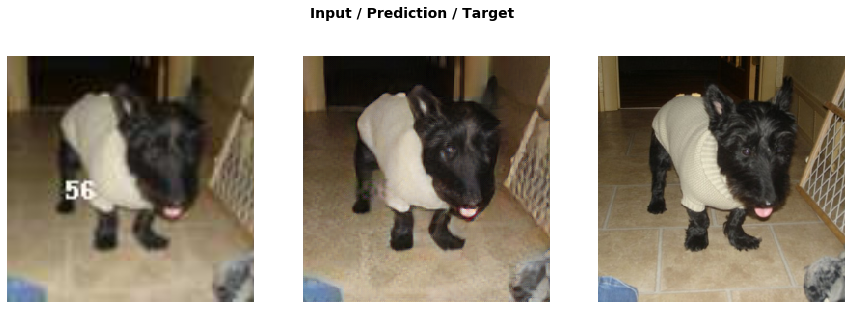

In [38]:
do_fit('2a')

In [26]:
learn.unfreeze()

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,3.703298,3.675650,0.157238,0.250825,0.328603,0.224027,0.493229,1.182279,1.039449,01:20
1,3.628964,3.605715,0.153674,0.247025,0.322630,0.218597,0.484750,1.161534,1.017506,01:08
2,3.610038,3.570133,0.153290,0.245268,0.319733,0.216058,0.478853,1.150315,1.006616,01:08
3,3.587896,3.551405,0.152148,0.244293,0.318323,0.214587,0.476541,1.145358,1.000156,01:08
4,3.563560,3.538513,0.151551,0.243685,0.317178,0.213676,0.475437,1.141532,0.995454,01:08
5,3.574677,3.530749,0.152053,0.243481,0.316727,0.213244,0.472780,1.138766,0.993698,01:08
6,3.549837,3.525641,0.151657,0.243093,0.316269,0.212722,0.473021,1.137995,0.990884,01:08
7,3.570917,3.523420,0.151522,0.243043,0.316126,0.212587,0.472386,1.137174,0.990583,01:08
8,3.561102,3.520917,0.151614,0.243036,0.316080,0.212448,0.471412,1.136416,0.989911,01:08
9,3.567914,3.522362,0.151291,0.242840,0.315879,0.212548,0.472792,1.136782,0.990230,01:08


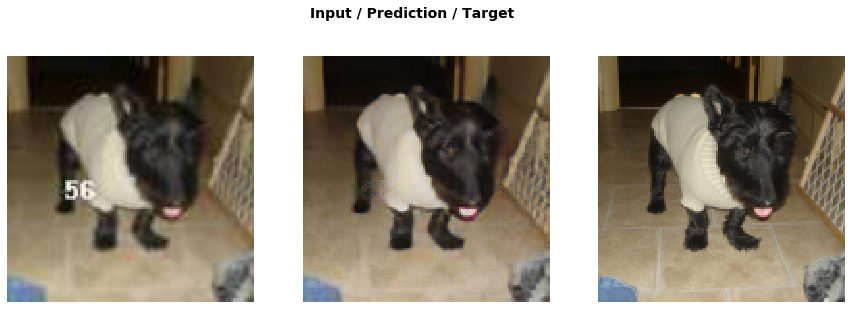

In [27]:
do_fit('2b', slice(1e-6,1e-4), pct_start=0.3)

In [32]:
data = get_data(9,272)

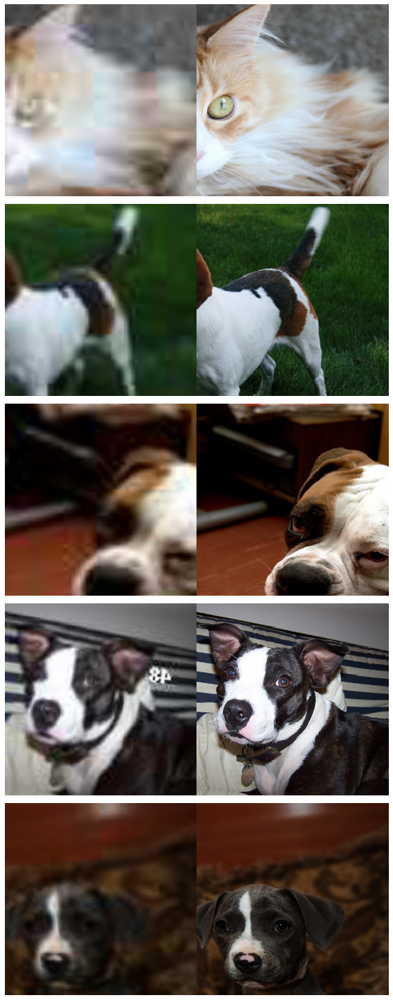

In [33]:
data.show_batch()

In [34]:
learn.data = data
learn.freeze()
gc.collect()

21205

In [35]:
learn.load('2b')

Learner(data=ImageDataBunch;

Train: LabelList (6651 items)
x: ImageImageList
Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272)
y: ImageList
Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272)
Path: /home/jupyter/.fastai/data/oxford-iiit-pet/crappy;

Valid: LabelList (739 items)
x: ImageImageList
Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272)
y: ImageList
Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272),Image (3, 272, 272)
Path: /home/jupyter/.fastai/data/oxford-iiit-pet/crappy;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, pa

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,2.127152,2.120326,0.177253,0.272374,0.299014,0.152140,0.342253,0.545013,0.332279,06:00
1,2.110635,2.117372,0.178589,0.272714,0.298428,0.151289,0.340852,0.544752,0.330747,05:45
2,2.106364,2.111201,0.176911,0.271678,0.298326,0.151103,0.340732,0.542314,0.330136,05:45
3,2.111274,2.113874,0.180266,0.273333,0.298095,0.151262,0.336553,0.544456,0.329910,05:45
4,2.111080,2.111827,0.178487,0.270427,0.297049,0.150453,0.343095,0.542956,0.329360,05:45
5,2.098444,2.113252,0.177359,0.272094,0.297652,0.150977,0.341937,0.544021,0.329212,05:45
6,2.082001,2.113296,0.179931,0.271857,0.295820,0.150578,0.342722,0.543135,0.329252,05:45
7,2.091323,2.100630,0.180336,0.271156,0.296078,0.150299,0.336788,0.538325,0.327647,05:45
8,2.081279,2.102005,0.180248,0.273811,0.297049,0.150338,0.333212,0.538951,0.328396,05:45
9,2.052933,2.077161,0.177561,0.270240,0.294516,0.148476,0.329216,0.532695,0.324458,05:45


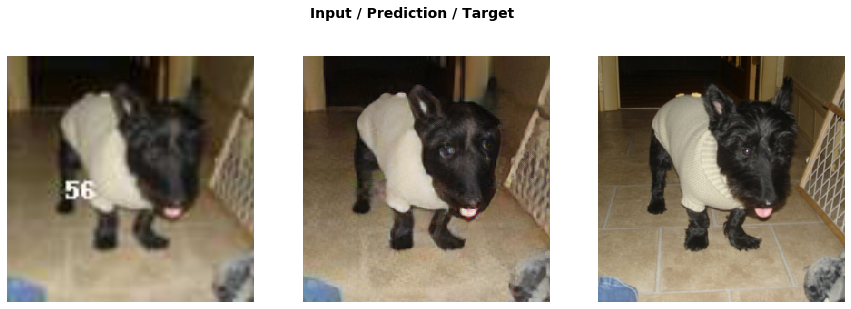

In [36]:
do_fit('3a')

epoch,train_loss,valid_loss,pixel,feat_0,feat_1,feat_2,gram_0,gram_1,gram_2,time
0,2.064599,2.075736,0.177981,0.270766,0.294623,0.148402,0.327712,0.532238,0.324014,05:58
1,2.054805,2.072485,0.177654,0.270332,0.293891,0.148098,0.327741,0.531350,0.323419,05:58
2,2.039878,2.072169,0.177145,0.270105,0.294175,0.148319,0.327255,0.531634,0.323535,05:58
3,2.042268,2.070644,0.178328,0.270563,0.293973,0.148007,0.325567,0.531300,0.322907,05:58
4,2.050412,2.069523,0.178969,0.270531,0.293695,0.147693,0.326097,0.530196,0.322341,05:58
5,2.042382,2.065779,0.178323,0.269863,0.293229,0.147372,0.325750,0.529181,0.322061,05:58
6,2.033901,2.063324,0.177709,0.269666,0.293230,0.147265,0.325050,0.528716,0.321689,05:58
7,2.030683,2.061726,0.177956,0.270120,0.293284,0.147441,0.323557,0.528038,0.321330,05:58
8,2.052581,2.063689,0.178538,0.270488,0.293581,0.147391,0.323576,0.528731,0.321386,05:58
9,2.025253,2.062293,0.177626,0.269963,0.293402,0.147329,0.324191,0.528319,0.321463,05:58


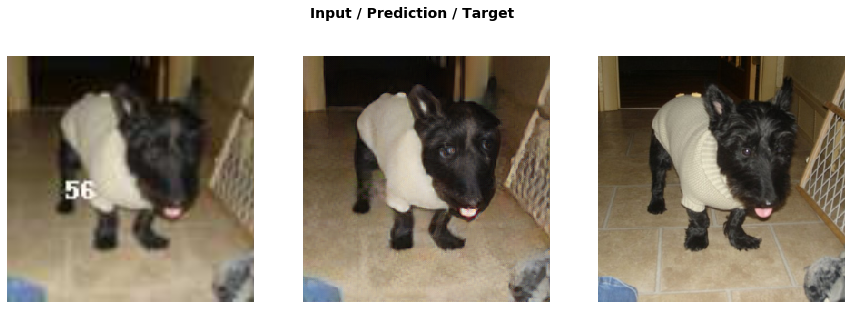

In [37]:
learn.unfreeze()
do_fit('3b', slice(1e-6,1e-4), pct_start=0.3 )

## Test
Instead of starting with your low res images, start with medium res one(size=256 stored in path_mr

In [41]:
learn = None
gc.collect();

In [42]:
256/320*1024

819.2

In [43]:
256/320*1600

1280.0

In [44]:
free = gpu_mem_get_free_no_cache()
# the max size of the test image depends on the available GPU RAM 
if free > 8000: size=(1280, 1600) # >  8GB RAM
else:           size=( 820, 1024) # <= 8GB RAM
print(f"using size={size}, have {free}MB of GPU RAM free")

using size=(1280, 1600), have 14103MB of GPU RAM free


In [45]:
learn = unet_learner(data, arch, loss_func=F.l1_loss, blur=True, norm_type=NormType.Weight)

In [116]:
data_hr = (ImageImageList.from_folder(path_hr).split_by_rand_pct(0.1, seed=42)
          .label_from_func(lambda x: path_hr/x.name)
          .transform(get_transforms(), size=size, tfm_y=True)
          .databunch(bs=4).normalize(imagenet_stats, do_y=True))
data_hr.c = 3

In [47]:
learn.load('3b');

In [117]:
learn.data = data_hr

In [90]:
fn = data_hr.valid_ds.x.items[0]; fn

PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/american_pit_bull_terrier_120.jpg')

In [91]:
img = open_image(fn); img.shape

torch.Size([3, 292, 300])

In [92]:
p,img_hr,b = learn.predict(img)

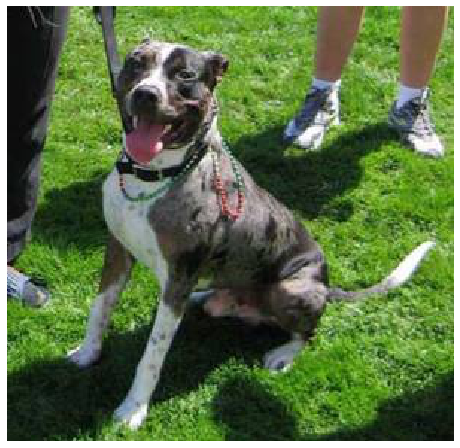

In [93]:
show_image(img, figsize=(8,8), interpolation='nearest');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


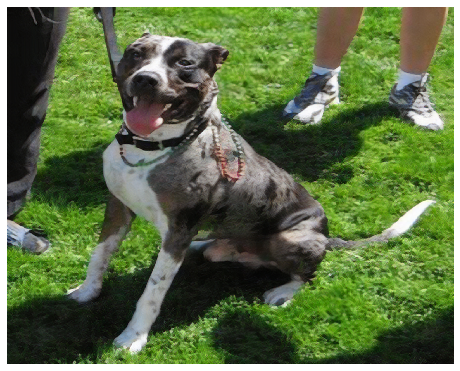

In [94]:
Image(img_hr).show(figsize=(8,8))

In [69]:
fn = data_hr.valid_ds.x.items[5]; fn

PosixPath('/home/jupyter/.fastai/data/oxford-iiit-pet/images/newfoundland_159.jpg')

In [70]:
img1 = open_image(fn); img1.shape

torch.Size([3, 375, 500])

In [71]:
p,img1_hr,b = learn.predict(img1)

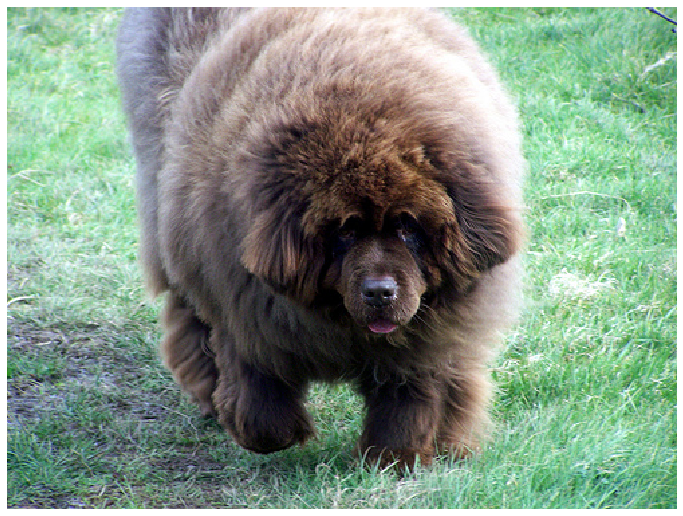

In [72]:
show_image(img1, figsize=(12,12), interpolation='nearest');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


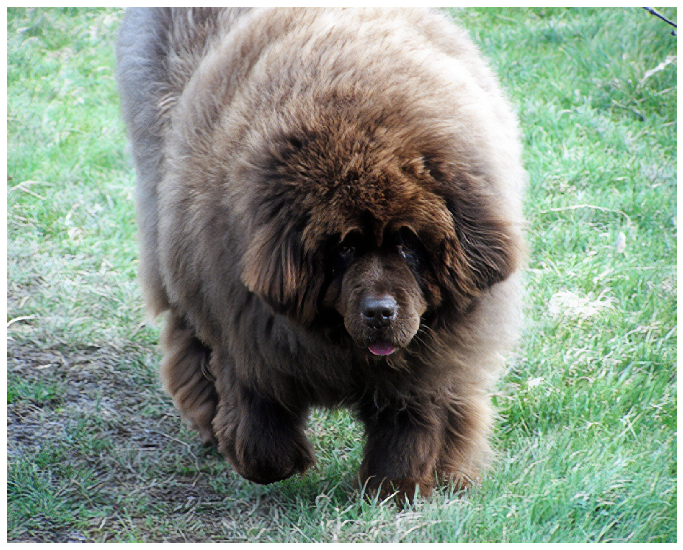

In [73]:
Image(img1_hr).show(figsize=(12,12))

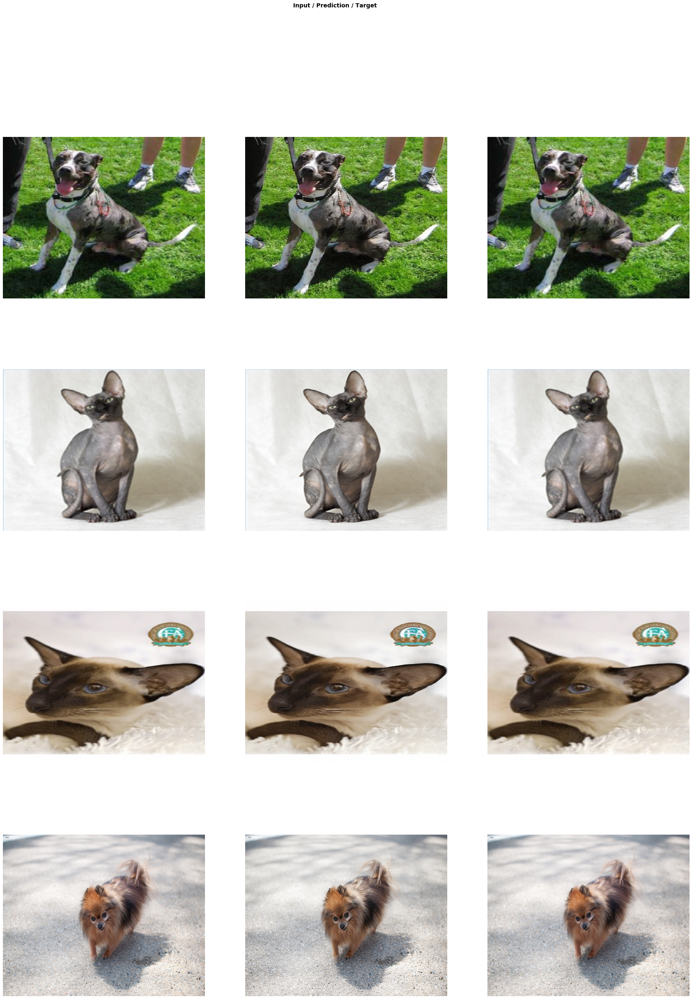

In [120]:
learn.show_results(rows=4, ds_type=DatasetType.Valid, imgsize=10)

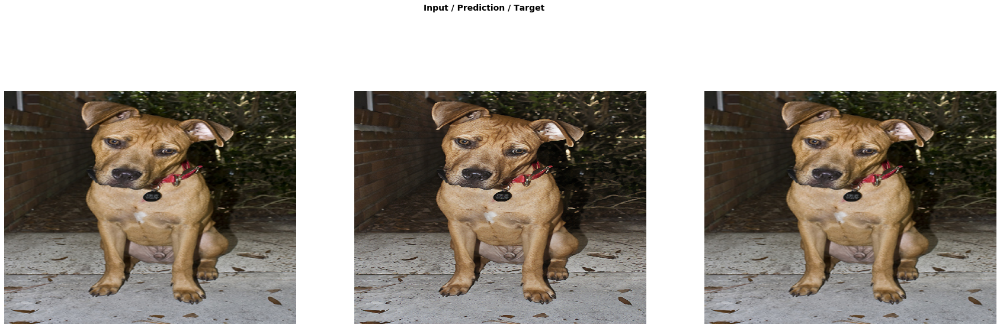

In [97]:
learn.show_results(rows=2, ds_type=DatasetType.Train, imgsize=10)

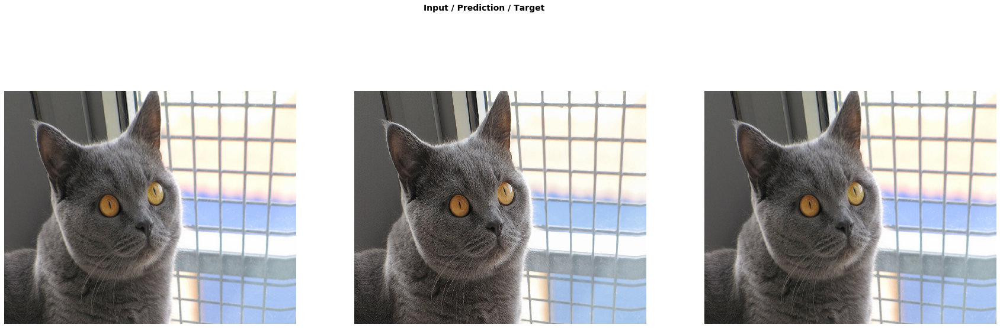

In [109]:
learn.show_results(ds_type=DatasetType.Train, imgsize=10)

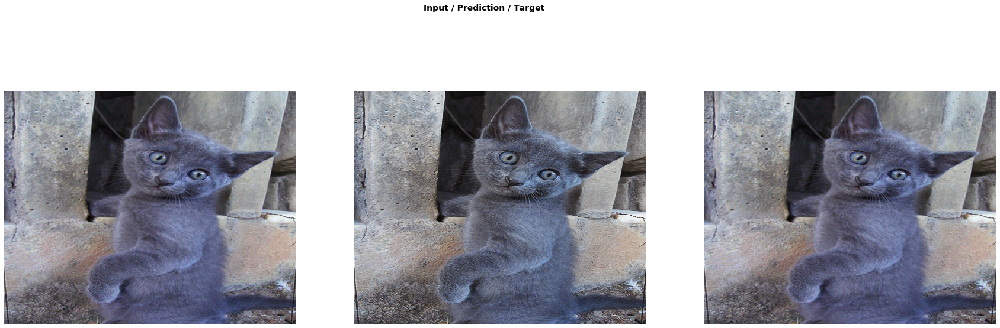

In [112]:
learn.show_results(ds_type=DatasetType.Train, imgsize=10)

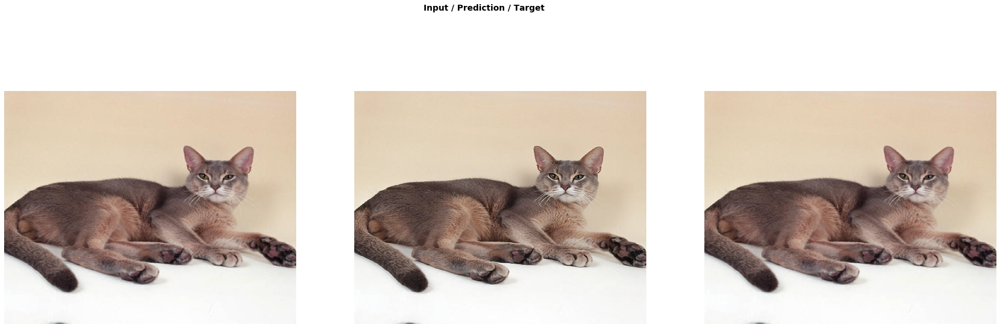

In [115]:
learn.show_results(ds_type=DatasetType.Train, imgsize=10)

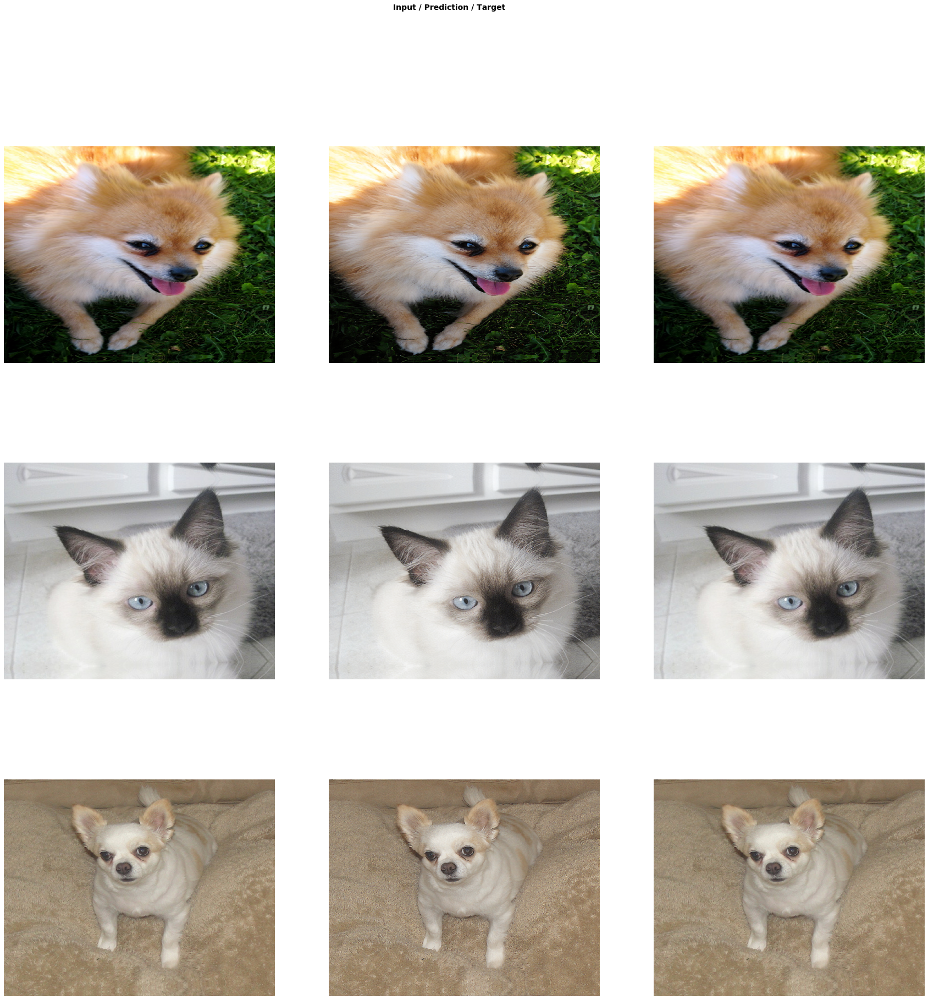

In [118]:
learn.show_results(rows=3, ds_type=DatasetType.Train, imgsize=10)